# DETR

Обучим модель DETR, пользуясь PyTorch и Tensorboard 

## Создаем окружение, подгружаем библиотеки

In [5]:
pip


Usage:   
  c:\Users\User\Documents\VUZ\psuObjectDecection\detrAndYoloNotebook\.venv\Scripts\python.exe -m pip <command> [options]

Commands:
  install                     Install packages.
  download                    Download packages.
  uninstall                   Uninstall packages.
  freeze                      Output installed packages in requirements format.
  inspect                     Inspect the python environment.
  list                        List installed packages.
  show                        Show information about installed packages.
  check                       Verify installed packages have compatible dependencies.
  config                      Manage local and global configuration.
  search                      Search PyPI for packages.
  cache                       Inspect and manage pip's wheel cache.
  index                       Inspect information available from package indexes.
  wheel                       Build wheels from your requirements.
  hash      

In [1]:
!pip install -q git+https://github.com/huggingface/transformers.git

In [6]:
!pip install -q pytorch-lightning

In [7]:
!pip install pickleshare

  Using cached pickleshare-0.7.5-py2.py3-none-any.whl.metadata (1.5 kB)


## Загрузка и предобработка данных

Здесь мы загружаем пример набора данных, размещенный на Github.

In [9]:
!wget https://github.com/matterport/Mask_RCNN/releases/download/v2.1/balloon_dataset.zip

"wget" �� ���� ����७��� ��� ���譥�
��������, �ᯮ��塞�� �ணࠬ��� ��� ������ 䠩���.


Аннотации данного датасета, которые содержат информацию о том, где находятся
искомые нами на изображении объекты, представлены в VIA формате, однако
`YolosFeatureExtractor` работает с аннотациями в COCO формате, поэтому надо
осуществить преобразование.

Из формата VIA это можно сделать с помощью конкретного инструмента

In [10]:
!git clone https://github.com/woctezuma/VIA2COCO
%cd VIA2COCO/
!git checkout fixes

c:\Users\User\Documents\VUZ\psuObjectDecection\detrAndYoloNotebook\VIA2COCO


fatal: destination path 'VIA2COCO' already exists and is not an empty directory.
c:\Users\User\Documents\VUZ\psuObjectDecection\detrAndYoloNotebook\.venv\lib\site-packages\IPython\core\magics\osm.py:417: UserWarning: This is now an optional IPython functionality, setting dhist requires you to install the `pickleshare` library.
  self.shell.db['dhist'] = compress_dhist(dhist)[-100:]


Your branch is up to date with 'origin/fixes'.


Already on 'fixes'


In [12]:
!pip install pillow

   ---------------------------------------- 0.0/2.5 MB ? eta -:--:--
    --------------------------------------- 0.0/2.5 MB 991.0 kB/s eta 0:00:03
   -- ------------------------------------- 0.2/2.5 MB 2.0 MB/s eta 0:00:02
   ----- ---------------------------------- 0.3/2.5 MB 2.9 MB/s eta 0:00:01
   -------- ------------------------------- 0.5/2.5 MB 3.0 MB/s eta 0:00:01
   -------------- ------------------------- 0.9/2.5 MB 4.3 MB/s eta 0:00:01
   ---------------------- ----------------- 1.4/2.5 MB 5.6 MB/s eta 0:00:01
   ------------------------- -------------- 1.6/2.5 MB 6.1 MB/s eta 0:00:01
   ----------------------------- ---------- 1.9/2.5 MB 5.7 MB/s eta 0:00:01
   -------------------------------------- - 2.5/2.5 MB 6.8 MB/s eta 0:00:01
   ---------------------------------------- 2.5/2.5 MB 6.5 MB/s eta 0:00:00


In [13]:
from VIA2COCO import convert

In [24]:
data_path = 'E:\\image_recognition\\lecture6\\'

first_class_index = 0

for keyword in ['train', 'val']:

  #input_dir = data_path + keyword + '/'
  #input_json = input_dir + 'via_region_data.json'
  input_dir = 'E:\\image_recognition\\lecture6\\balloon\\train\\'
  input_json ='E:\\image_recognition\\lecture6\\balloon\\train\\via_region_data.json'
  categories = ['balloon']
  super_categories = ['N/A']
  output_json = input_dir + 'custom_' + keyword + '.json'

  print('Конвертируем {} из VIA формата в COCO формат'.format(input_json))

  coco_dict = convert.convert(
      imgdir=input_dir,
      annpath=input_json,
      categories=categories,
      super_categories=super_categories,
      output_file_name=output_json,
      first_class_index=first_class_index,
  )

Конвертируем E:\image_recognition\lecture6\balloon\train\via_region_data.json из VIA формата в COCO формат
Saving to E:\image_recognition\lecture6\balloon\train\custom_train.json
Конвертируем E:\image_recognition\lecture6\balloon\train\via_region_data.json из VIA формата в COCO формат
Saving to E:\image_recognition\lecture6\balloon\train\custom_val.json


## Создаем PyTorch dataset и dataloaders

Здесь мы определяем обычный dataset PyTorch. Каждый элемент набора данных
представляет собой изображение и соответствующие аннотации. Torchvision уже
предоставляет набор данных CocoDetection, который можно использовать. Мы
добавляем экстрактор признаков («YolosFeatureExtractor») только для изменения
размера и нормализации изображений и для преобразования аннотаций (которые
находятся в формате COCO) в формат, ожидаемый DETR (DEtection TRansformer). Он
также соответствующим образом изменит размер аннотаций.

In [21]:
import torchvision
import os

class CocoDetection(torchvision.datasets.CocoDetection):
    def __init__(self, img_folder, feature_extractor, train=True):
        ann_file = os.path.join(img_folder, "custom_train.json" if train else "custom_val.json")
        super(CocoDetection, self).__init__(img_folder, ann_file)
        self.feature_extractor = feature_extractor

    def __getitem__(self, idx):
        # считывание изображения и ожидаемого ответа (лейбл или target) в формат COCO
        img, target = super(CocoDetection, self).__getitem__(idx)

        # обработать изображение и таргет (привести target к формату DETR,
        # изменить размер, нормализовать)
        image_id = self.ids[idx]
        target = {'image_id': image_id, 'annotations': target}
        encoding = self.feature_extractor(images=img, annotations=target, return_tensors="pt")
        pixel_values = encoding["pixel_values"].squeeze() # удалить размер batch
        target = encoding["labels"][0] # удалить размер batch

        return pixel_values, target

На основе определенного выше класса мы создаем наборы данных для обучения и проверки.

In [22]:
!pip install pycocotools

In [25]:
from transformers import AutoFeatureExtractor

feature_extractor = AutoFeatureExtractor.from_pretrained("hustvl/yolos-small", size=512, max_size=864)

train_dataset = CocoDetection(img_folder= data_path + 'balloon/train', feature_extractor=feature_extractor)
val_dataset = CocoDetection(img_folder=data_path + 'balloon/val', feature_extractor=feature_extractor, train=False)

loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
loading annotations into memory...
Done (t=0.00s)
creating index...
index created!


e:\image_recognition\.venv\Lib\site-packages\transformers\models\yolos\feature_extraction_yolos.py:38: FutureWarning: The class YolosFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use YolosImageProcessor instead.
  warnings.warn(


Как можно заметить, этот датасет небольшой:

In [26]:
print("Number of training examples:", len(train_dataset))
print("Number of validation examples:", len(val_dataset))

Number of training examples: 61
Number of validation examples: 13


Давайте визуализируем пример. Мы можем получить доступ к COCO API набора данных,
используя ''train_dataset.coco''.

Image: 42


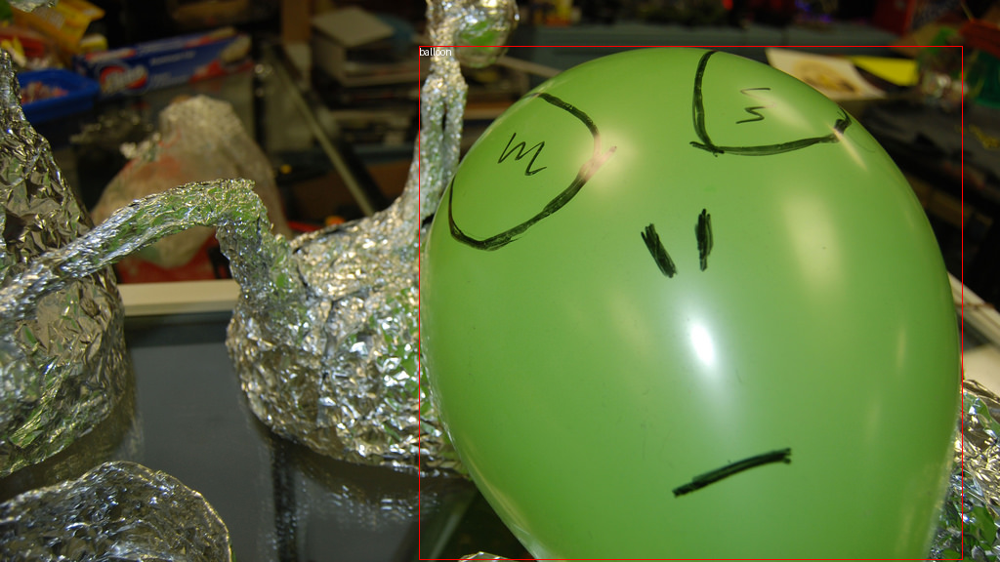

In [28]:
import numpy as np
import os
from PIL import Image, ImageDraw

# используя
# https://github.com/woctezuma/finetune-detr/blob/master/finetune_detr.ipynb
image_ids = train_dataset.coco.getImgIds()

image_id = image_ids[np.random.randint(0, len(image_ids))]
print('Image: {}'.format(image_id))
image = train_dataset.coco.loadImgs(image_id)[0]
image = Image.open(os.path.join(data_path + 'balloon/train', image['file_name']))

annotations = train_dataset.coco.imgToAnns[image_id]
draw = ImageDraw.Draw(image, "RGBA")

cats = train_dataset.coco.cats
id2label = {k: v['name'] for k,v in cats.items()}

for annotation in annotations:
  box = annotation['bbox']
  class_idx = annotation['category_id']
  x,y,w,h = tuple(box)
  draw.rectangle((x,y,x+w,y+h), outline='red', width=1)
  draw.text((x, y), id2label[class_idx], fill='white')

image

Теперь сделаем соответствующие dataloader'ы. Мы определяем собственный
`collate_fn` для создания батчей изображений. Поскольку DETR изменяет размеры
изображений до минимального размера 800 и максимального размера 1333,
изображения могут иметь разные размеры. Будем дополнять изображения
(''pixel_values'') до самого большого изображения в батче.

In [29]:
from torch.utils.data import DataLoader

def collate_fn(batch):
  pixel_values = [item[0] for item in batch]
  encoding = feature_extractor.pad(pixel_values, return_tensors="pt")
  labels = [item[1] for item in batch]
  batch = {}
  batch['pixel_values'] = encoding['pixel_values']
  batch['labels'] = labels
  return batch

train_dataloader = DataLoader(train_dataset, collate_fn=collate_fn, batch_size=1, shuffle=True)
val_dataloader = DataLoader(val_dataset, collate_fn=collate_fn, batch_size=1)
batch = next(iter(train_dataloader))

Давайте проверим ключи одного батча:

In [30]:
batch.keys()

dict_keys(['pixel_values', 'labels'])

Проверим размерность `pixel_values` и проверим `target`:

In [31]:
pixel_values, target = train_dataset[0]

In [32]:
pixel_values.shape

torch.Size([3, 512, 672])

In [33]:
print(target)

{'size': tensor([512, 672]), 'image_id': tensor([0]), 'class_labels': tensor([0]), 'boxes': tensor([[0.5955, 0.5811, 0.2202, 0.3561]]), 'area': tensor([1485.3125]), 'iscrowd': tensor([0]), 'orig_size': tensor([1536, 2048])}


## Обучим модель с помощью PyTorch Lightning

Определим `LightningModule`, что-то типа `nn.Module` с некоторыми
дополнительными функциями.

In [34]:
import pytorch_lightning as pl
from transformers import DetrConfig, AutoModelForObjectDetection
import torch

In [35]:
class Detr(pl.LightningModule):
     def __init__(self, lr, weight_decay):
         super().__init__()

         self.model = AutoModelForObjectDetection.from_pretrained("hustvl/yolos-small",
                                                             num_labels=len(id2label),
                                                             ignore_mismatched_sizes=True)
         self.lr = lr
         self.weight_decay = weight_decay

     def forward(self, pixel_values):
       outputs = self.model(pixel_values=pixel_values)

       return outputs

     def common_step(self, batch, batch_idx):
       pixel_values = batch["pixel_values"]
       labels = [{k: v.to(self.device) for k, v in t.items()} for t in batch["labels"]]

       outputs = self.model(pixel_values=pixel_values, labels=labels)

       loss = outputs.loss
       loss_dict = outputs.loss_dict

       return loss, loss_dict

     def training_step(self, batch, batch_idx):
        loss, loss_dict = self.common_step(batch, batch_idx)
        self.log("training_loss", loss)
        for k,v in loss_dict.items():
          self.log("train_" + k, v.item())

        return loss

     def validation_step(self, batch, batch_idx):
        loss, loss_dict = self.common_step(batch, batch_idx)
        self.log("validation_loss", loss)
        for k,v in loss_dict.items():
          self.log("validation_" + k, v.item())

        return loss

     def configure_optimizers(self):
        optimizer = torch.optim.AdamW(self.parameters(), lr=self.lr,
                                  weight_decay=self.weight_decay)

        return optimizer

     def train_dataloader(self):
        return train_dataloader

     def val_dataloader(self):
        return val_dataloader

Поскольку PyTorch Lightning по умолчанию логирует в Tensorboard, попробуем его
открыть:

In [36]:
!pip install -U torch-tb-profiler

   ---------------------------------------- 0.0/1.1 MB ? eta -:--:--
   ---------------------------------------- 0.0/1.1 MB ? eta -:--:--
   - -------------------------------------- 0.0/1.1 MB 435.7 kB/s eta 0:00:03
   -- ------------------------------------- 0.1/1.1 MB 653.6 kB/s eta 0:00:02
   ---- ----------------------------------- 0.1/1.1 MB 726.2 kB/s eta 0:00:02
   ------ --------------------------------- 0.2/1.1 MB 871.5 kB/s eta 0:00:02
   --------- ------------------------------ 0.3/1.1 MB 1.1 MB/s eta 0:00:01
   ----------- ---------------------------- 0.3/1.1 MB 1.1 MB/s eta 0:00:01
   ---------------- ----------------------- 0.4/1.1 MB 1.4 MB/s eta 0:00:01
   ------------------- -------------------- 0.5/1.1 MB 1.5 MB/s eta 0:00:01
   ---------------------- ----------------- 0.6/1.1 MB 1.6 MB/s eta 0:00:01
   ------------------------ --------------- 0.6/1.1 MB 1.4 MB/s eta 0:00:01
   ------------------------------- -------- 0.8/1.1 MB 1.8 MB/s eta 0:00:01
   ---------------

In [37]:
# Используем tensorboard.
%load_ext tensorboard
%tensorboard --logdir lightning_logs/

Launching TensorBoard...

Определим модель и проверим выходные данные.

In [38]:
model = Detr(lr=2.5e-5, weight_decay=1e-4)

outputs = model(pixel_values=batch['pixel_values'])

config.json:   0%|          | 0.00/4.13k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/123M [00:00<?, ?B/s]

Some weights of YolosForObjectDetection were not initialized from the model checkpoint at hustvl/yolos-small and are newly initialized because the shapes did not match:
- class_labels_classifier.layers.2.weight: found shape torch.Size([92, 384]) in the checkpoint and torch.Size([2, 384]) in the model instantiated
- class_labels_classifier.layers.2.bias: found shape torch.Size([92]) in the checkpoint and torch.Size([2]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Дальше - обучение! При обучении будем использовать градиентное отсечение
(gradient clipping). Можно использовать Tensorboard для отслеживания значения
функции потерь.

In [39]:
from pytorch_lightning import Trainer

trainer = Trainer(accelerator='auto', max_steps=2000, gradient_clip_val=0.1, accumulate_grad_batches=4)
trainer.fit(model)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
You are using a CUDA device ('NVIDIA GeForce RTX 4070 Laptop GPU') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
Missing logger folder: e:\image_recognition\lecture6\VIA2COCO\lightning_logs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name  | Type                    | Params
--------------------------------------------------
0 | model | YolosForObjectDetection | 30.7 M
--------------------------------------------------
30.7 M    Trainable params
0         Non-trainable params
30.7 M    Total params
122.600   Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

e:\image_recognition\.venv\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:441: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.
e:\image_recognition\.venv\Lib\site-packages\pytorch_lightning\utilities\data.py:77: Trying to infer the `batch_size` from an ambiguous collection. The batch size we found is 1. To avoid any miscalculations, use `self.log(..., batch_size=batch_size)`.
e:\image_recognition\.venv\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:441: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Training: |          | 0/? [00:00<?, ?it/s]

model.safetensors:   0%|          | 0.00/123M [00:00<?, ?B/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_steps=2000` reached.


## Подсчёт метрик

Наконец, оценим модель на val наборе. В исходном репозитории DETR есть несколько
хороших инструментов оценки, которые можно использовать.

Они основаны на классе `CocoEvaluator` из torchvision

In [40]:
!git clone https://github.com/facebookresearch/detr.git

Cloning into 'detr'...


In [41]:
%cd detr

e:\image_recognition\lecture6\VIA2COCO\detr


e:\image_recognition\.venv\Lib\site-packages\IPython\core\magics\osm.py:417: UserWarning: using dhist requires you to install the `pickleshare` library.
  self.shell.db['dhist'] = compress_dhist(dhist)[-100:]


In [43]:
from detr.datasets import get_coco_api_from_dataset

base_ds = get_coco_api_from_dataset(val_dataset)

In [54]:
from datasets.coco_eval import CocoEvaluator
from tqdm.notebook import tqdm

iou_types = ['bbox']
coco_evaluator = CocoEvaluator(base_ds, iou_types)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model.to(device)
model.eval()

Detr(
  (model): YolosForObjectDetection(
    (vit): YolosModel(
      (embeddings): YolosEmbeddings(
        (patch_embeddings): YolosPatchEmbeddings(
          (projection): Conv2d(3, 384, kernel_size=(16, 16), stride=(16, 16))
        )
        (dropout): Dropout(p=0.0, inplace=False)
        (interpolation): InterpolateInitialPositionEmbeddings()
      )
      (encoder): YolosEncoder(
        (layer): ModuleList(
          (0-11): 12 x YolosLayer(
            (attention): YolosAttention(
              (attention): YolosSelfAttention(
                (query): Linear(in_features=384, out_features=384, bias=True)
                (key): Linear(in_features=384, out_features=384, bias=True)
                (value): Linear(in_features=384, out_features=384, bias=True)
                (dropout): Dropout(p=0.0, inplace=False)
              )
              (output): YolosSelfOutput(
                (dense): Linear(in_features=384, out_features=384, bias=True)
                (dropout): Dropo

In [45]:
!pip install ipywidgets

In [46]:
!jupyter nbextension enable --py widgetsnbextension

usage: jupyter [-h] [--version] [--config-dir] [--data-dir] [--runtime-dir]
               [--paths] [--json] [--debug]
               [subcommand]

Jupyter: Interactive Computing

positional arguments:
  subcommand     the subcommand to launch

options:
  -h, --help     show this help message and exit
  --version      show the versions of core jupyter packages and exit
  --config-dir   show Jupyter config dir
  --data-dir     show Jupyter data dir
  --runtime-dir  show Jupyter runtime dir
  --paths        show all Jupyter paths. Add --json for machine-readable
                 format.
  --json         output paths as machine-readable json
  --debug        output debug information about paths

Available subcommands: dejavu events execute kernel kernelspec lab
labextension labhub migrate nbconvert notebook run server troubleshoot trust

Jupyter command `jupyter-nbextension` not found.


In [47]:
!pip install jupyter_contrib_nbextensions

     ---------------------------------------- 0.0/23.5 MB ? eta -:--:--
     --------------------------------------- 0.0/23.5 MB 991.0 kB/s eta 0:00:24
     --------------------------------------- 0.1/23.5 MB 660.6 kB/s eta 0:00:36
     ---------------------------------------- 0.2/23.5 MB 2.1 MB/s eta 0:00:12
     - -------------------------------------- 0.7/23.5 MB 4.4 MB/s eta 0:00:06
     -- ------------------------------------- 1.2/23.5 MB 5.8 MB/s eta 0:00:04
     -- ------------------------------------- 1.5/23.5 MB 6.5 MB/s eta 0:00:04
     --- ------------------------------------ 2.1/23.5 MB 7.5 MB/s eta 0:00:03
     ---- ----------------------------------- 2.5/23.5 MB 7.5 MB/s eta 0:00:03
     ---- ----------------------------------- 2.9/23.5 MB 8.1 MB/s eta 0:00:03
     ----- ---------------------------------- 3.3/23.5 MB 8.4 MB/s eta 0:00:03
     ------ --------------------------------- 3.7/23.5 MB 8.5 MB/s eta 0:00:03
     ------- -------------------------------- 4.3/23.5 MB

In [28]:
%cd ..

c:\My-University-Documents\yandex-assist-spring\lecture6


c:\My-University-Documents\yandex-assist-spring\.venv\lib\site-packages\IPython\core\magics\osm.py:417: UserWarning: using dhist requires you to install the `pickleshare` library.
  self.shell.db['dhist'] = compress_dhist(dhist)[-100:]


In [55]:
print("Запуск оценки...")

for idx, batch in enumerate(tqdm(val_dataloader)):
    pixel_values = batch["pixel_values"].to(device)
    labels = [{k: v.to(device) for k, v in t.items()} for t in batch["labels"]]

    outputs = model.model(pixel_values=pixel_values)
    orig_target_sizes = torch.stack([target["orig_size"] for target in labels], dim=0)
    results = feature_extractor.post_process(outputs, orig_target_sizes)
    res = {target['image_id'].item(): output for target, output in zip(labels, results)}
    coco_evaluator.update(res)

coco_evaluator.synchronize_between_processes()
coco_evaluator.accumulate()
coco_evaluator.summarize()

Запуск оценки...


  0%|          | 0/13 [00:00<?, ?it/s]

Accumulating evaluation results...
DONE (t=0.01s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.413
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.571
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.464
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.340
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.620
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = -1.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.162
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.474
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.510
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.344
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.704
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= l

## Использование и визуализация

Визуализируем предсказания DETR на некотором изображении из val.

In [56]:
pixel_values, target = val_dataset[1]

In [57]:
pixel_values = pixel_values.unsqueeze(0).to(device)
print(pixel_values.shape)

torch.Size([1, 3, 672, 512])


In [58]:
outputs = model(pixel_values=pixel_values)

In [59]:
import torch
import matplotlib.pyplot as plt

COLORS = [[0.000, 0.447, 0.741], [0.850, 0.325, 0.098], [0.929, 0.694, 0.125],
          [0.494, 0.184, 0.556], [0.466, 0.674, 0.188], [0.301, 0.745, 0.933]]

def box_cxcywh_to_xyxy(x):
    x_c, y_c, w, h = x.unbind(1)
    b = [(x_c - 0.5 * w), (y_c - 0.5 * h),
         (x_c + 0.5 * w), (y_c + 0.5 * h)]
    return torch.stack(b, dim=1)

def rescale_bboxes(out_bbox, size):
    img_w, img_h = size
    b = box_cxcywh_to_xyxy(out_bbox)
    b = b * torch.tensor([img_w, img_h, img_w, img_h], dtype=torch.float32)
    return b

def plot_results(pil_img, prob, boxes):
    plt.figure(figsize=(16,10))
    plt.imshow(pil_img)
    ax = plt.gca()
    colors = COLORS * 100
    for p, (xmin, ymin, xmax, ymax), c in zip(prob, boxes.tolist(), colors):
        ax.add_patch(plt.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin,
                                   fill=False, color=c, linewidth=3))
        cl = p.argmax()
        text = f'{id2label[cl.item()]}: {p[cl]:0.2f}'
        ax.text(xmin, ymin, text, fontsize=15,
                bbox=dict(facecolor='yellow', alpha=0.5))
    plt.axis('off')
    plt.show()

In [60]:
def visualize_predictions(image, outputs, threshold=0.9):
  # визуализировать рамки для предсказаний, которые выше порогового значения
  probas = outputs.logits.softmax(-1)[0, :, :-1]
  keep = probas.max(-1).values > threshold

  # конветировать рамки предсказаний для конкретного изображения
  bboxes_scaled = rescale_bboxes(outputs.pred_boxes[0, keep].cpu(), image.size)

  plot_results(image, probas[keep], bboxes_scaled)

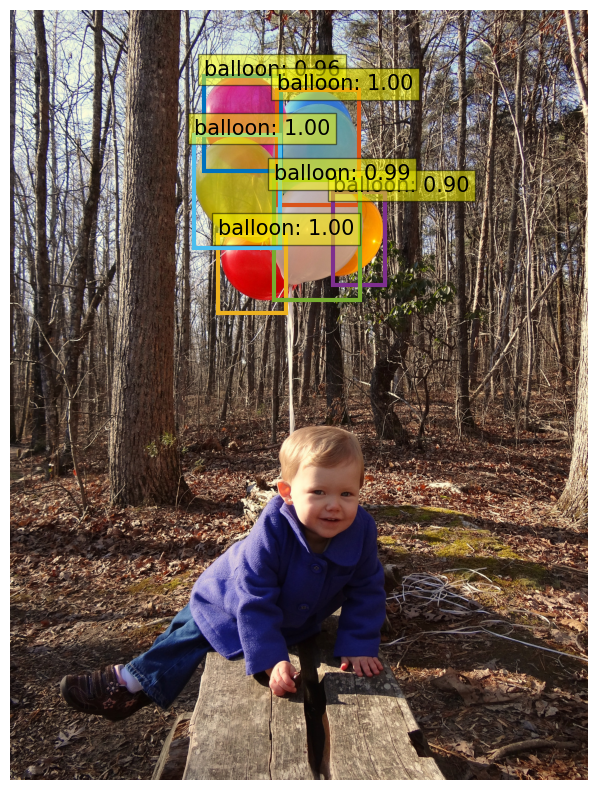

In [64]:
image_id = target['image_id'].item()
image = val_dataset.coco.loadImgs(image_id)[0]
image = Image.open(os.path.join('e:\\image_recognition\\lecture6\\balloon\\val', image['file_name']))

visualize_predictions(image, outputs, threshold=0.5)

P.S. На данном этапе модель не обучена... Постарайся получить результаты получше :)

# Yolo

## Установка

In [ ]:
!git clone https://github.com/ultralytics/yolov5

Cloning into 'yolov5'...


In [1]:
!pip install utils

  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Created wheel for utils: filename=utils-1.0.2-py2.py3-none-any.whl size=13934 sha256=66adedaa565a9b807056e359acf814f65a82a31bd516bd0628a2bc623dc7ea2c
  Stored in directory: c:\users\marin\appdata\local\pip\cache\wheels\15\0c\b3\674aea8c5d91c642c817d4d630bd58faa316724b136844094d
Successfully built utils


In [2]:
%cd yolov5
%pip install -qr requirements.txt comet_ml

import torch
import utils
display = utils.notebook_init()

YOLOv5  v7.0-295-gac6c4383 Python-3.11.7 torch-2.2.0+cu118 CUDA:0 (NVIDIA GeForce RTX 4070 Laptop GPU, 8188MiB)


Setup complete  (20 CPUs, 31.6 GB RAM, 21.7/585.9 GB disk)


## 1. Применение

`detect.py` выполняет вывод YOLOv5 на различных источниках, автоматически
загружая модели с последнего релиза YOLO, и сохраняя результаты в runs/detect.
Примеры источников вывода:


```shell
python detect.py --source 0  # webcam
                          img.jpg  # image
                          vid.mp4  # video
                          screen  # screenshot
                          path/  # directory
                         'path/*.jpg'  # glob
                         'https://youtu.be/LNwODJXcvt4'  # YouTube
                         'rtsp://example.com/media.mp4'  # RTSP, RTMP, HTTP stream
```

In [3]:
!python detect.py --weights yolov5s.pt --img 640 --conf 0.25 --source data/images

detect: weights=['yolov5s.pt'], source=data/images, data=data\coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs\detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5  v7.0-295-gac6c4383 Python-3.11.7 torch-2.2.0+cu118 CUDA:0 (NVIDIA GeForce RTX 4070 Laptop GPU, 8188MiB)


  0%|          | 0.00/14.1M [00:00<?, ?B/s]
  1%|          | 120k/14.1M [00:00<00:14, 1.05MB/s]
  3%|▎         | 488k/14.1M [00:00<00:06, 2.38MB/s]
  7%|▋         | 984k/14.1M [00:00<00:04, 3.25MB/s]
 17%|█▋        | 2.41M/14.1M [00:00<00:01, 7.48MB/s]
 24%|██▍       | 3.36M/14.1M [00:00<00:01, 8.30MB/s]
 30%|██▉       | 4.19M/14.1M [00:00<00:01, 8.21MB/s]
 36%|███▌      | 5.02M/14.1M [00:00<00:01, 8.37MB/s]
 42%|████▏ 

In [5]:
pth ="e:\\image_recognition\\lecture6\\"

&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;
<img align="left" src="https://user-images.githubusercontent.com/26833433/127574988-6a558aa1-d268-44b9-bf6b-62d4c605cc72.jpg" width="600">

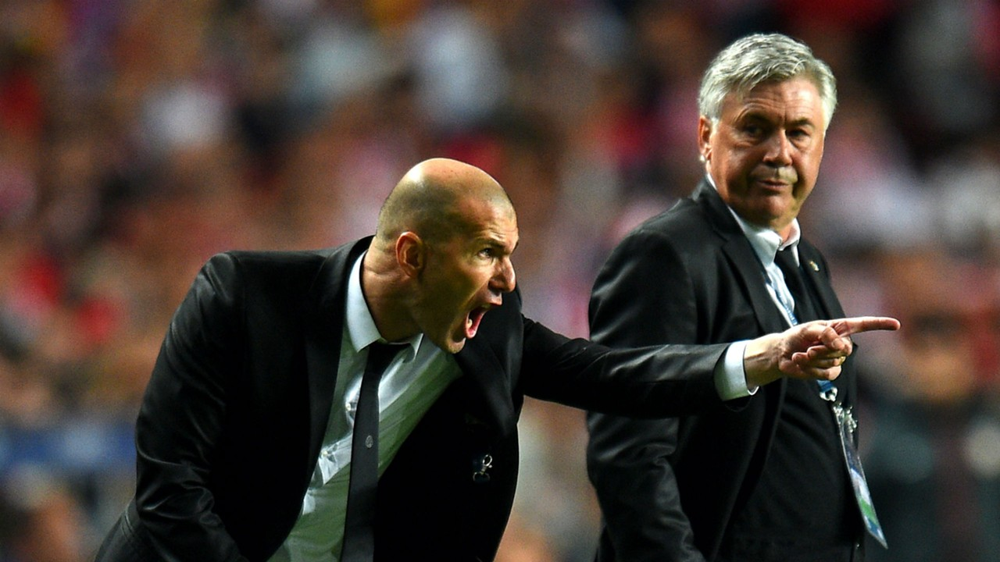

In [8]:
display.Image(filename=pth+'yolov5\\data\\images\\zidane.jpg', width=600)

## 2. Валидация
Проверить точность модели на наборе данных COCO на выборках val или test. Модели
загружаются автоматически из последнего релиза YOLOv5. Чтобы отобразить
результаты по классам, используйте флаг `--verbose`.

In [9]:
# Download COCO val
torch.hub.download_url_to_file('https://ultralytics.com/assets/coco2017val.zip', 'tmp.zip')  # download (780M - 5000 images)
!unzip -q tmp.zip -d ../datasets && rm tmp.zip  # unzip

100%|██████████| 780M/780M [03:35<00:00, 3.80MB/s] 
'unzip' is not recognized as an internal or external command,
operable program or batch file.


In [10]:
# Validate YOLOv5s on COCO val
!python val.py --weights yolov5s.pt --data coco.yaml --img 640 --half

val: data=E:\image_recognition\lecture6\yolov5\data\coco.yaml, weights=['yolov5s.pt'], batch_size=32, imgsz=640, conf_thres=0.001, iou_thres=0.6, max_det=300, task=val, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=True, project=runs\val, name=exp, exist_ok=False, half=True, dnn=False
YOLOv5  v7.0-295-gac6c4383 Python-3.11.7 torch-2.2.0+cu118 CUDA:0 (NVIDIA GeForce RTX 4070 Laptop GPU, 8188MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs

val: Scanning E:\image_recognition\lecture6\datasets\coco\val2017...:   0%|          | 0/5000 [00:00<?, ?it/s]
val: Scanning E:\image_recognition\lecture6\datasets\coco\val2017... 1 images, 0 backgrounds, 0 corrupt:   0%|          | 1/5000 [00:10<15:03:45, 10.85s/it]
val: Scanning E:\image_recognition\lecture6\datasets\coco\val2017... 96 images, 0 backgrounds, 0 corrupt:   2%|▏         | 96/5000 [00:10<06:34, 12.44it/s] 

## 3. Обучение

Обучите модель YOLOv5s на наборе данных COCO128 с использованием `--data
coco128.yaml`, начиная с предварительно обученных весов `--weights yolov5s.pt`,
либо с случайно инициализированными `--weights '' --cfg yolov5s.yaml`.

- Предварительно обученные модели загружаются автоматически из последнего релиза
  YOLOv5.
- Наборы данных, доступные для автоматической загрузки, включают: [COCO](https://github.com/ultralytics/yolov5/blob/master/data/coco.yaml), [COCO128](https://github.com/ultralytics/yolov5/blob/master/data/coco128.yaml), [VOC](https://github.com/ultralytics/yolov5/blob/master/data/VOC.yaml), [Argoverse](https://github.com/ultralytics/yolov5/blob/master/data/Argoverse.yaml), [VisDrone](https://github.com/ultralytics/yolov5/blob/master/data/VisDrone.yaml), [GlobalWheat](https://github.com/ultralytics/yolov5/blob/master/data/GlobalWheat2020.yaml), [xView](https://github.com/ultralytics/yolov5/blob/master/data/xView.yaml), [Objects365](https://github.com/ultralytics/yolov5/blob/master/data/Objects365.yaml), [SKU-110K](https://github.com/ultralytics/yolov5/blob/master/data/SKU-110K.yaml)
- Результаты обучения сохраняются в `runs/train/` с увеличивающимися номерами
директорий, например, `runs/train/exp2`, `runs/train/exp3` и так далее.

Для обучения используется dataloader **Mosaic**, который объединяет 4
изображения в одно мозаичное изображение.

### Roboflow

[Roboflow](https://roboflow.com/?ref=ultralytics) позволяет вам легко
**организовывать, размечать и подготавливать набор данных** высокого качества с
вашими собственными данными. Roboflow также упрощает настройку конвейера
активного обучения, сотрудничество с вашей командой по улучшению набора данных и
интеграцию напрямую в рабочий процесс построения модели с помощью пакета pip
`roboflow`.

https://github.com/ultralytics/yolov5/wiki/Train-Custom-Data

In [15]:
!pip3 freeze > requirements.txt 

In [14]:
!python train.py --img 640 --batch 16 --epochs 3 --data coco128.yaml --weights yolov5s.pt --cache 

train: weights=yolov5s.pt, cfg=, data=coco128.yaml, hyp=data\hyps\hyp.scratch-low.yaml, epochs=3, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, evolve_population=data\hyps, resume_evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs\train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest, ndjson_console=False, ndjson_file=False
github: up to date with https://github.com/ultralytics/yolov5 
YOLOv5  v7.0-295-gac6c4383 Python-3.11.7 torch-2.2.0+cu118 CUDA:0 (NVIDIA GeForce RTX 4070 Laptop GPU, 8188MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=